<a href="https://colab.research.google.com/github/Felimartinez1/Voice-Cloning/blob/main/Voice_Cloning_V4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Bark Notebook

>

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


## Setting

In [ ]:
!pip install git+https://github.com/suno-ai/bark.git
!git clone https://github.com/gitmylo/bark-voice-cloning-HuBERT-quantizer
!pip install -r ./bark-voice-cloning-HuBERT-quantizer/requirements.txt
!pip install pydub
!pip install TTS
!pip install pesq
!pip install noisereduce

  Cloning https://github.com/suno-ai/bark.git to /tmp/pip-req-build-nb1bvxt2
  Running command git clone --filter=blob:none --quiet https://github.com/suno-ai/bark.git /tmp/pip-req-build-nb1bvxt2
  Resolved https://github.com/suno-ai/bark.git to commit 773624d26db84278a55aacae9a16d7b25fbccab8
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 23.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.9/11.9 MB 71.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 5.7 MB/s eta 0:00:00
  Created wheel for suno-bark: filename=suno_bark-0.0.1a0-py3-none-any.whl size=2567

  Preparing metadata (setup.py) ... done
  Created wheel for pesq: filename=pesq-0.0.4-cp310-cp310-linux_x86_64.whl size=262935 sha256=f3e50d15084d1c834c2d620aba08643b2b2a8d7d1e857741ff1e1e430ee0d155
  Stored in directory: /root/.cache/pip/wheels/c5/4e/2c/251524370c0fdd659e99639a0fbd0ca5a782c3aafcd456b28d
Successfully built pesq


In [ ]:
# System
import sys
import os
from subprocess import call


# Data manipulation
import torch
import numpy as np


# Model / TTS
sys.path.append('./bark-voice-cloning-HuBERT-quantizer')
from bark.api import generate_audio
from bark.generation import SAMPLE_RATE, preload_models, load_codec_model
from encodec.utils import convert_audio
from bark_hubert_quantizer.customtokenizer import CustomTokenizer
from bark_hubert_quantizer.hubert_manager import HuBERTManager
from bark_hubert_quantizer.pre_kmeans_hubert import CustomHubert

from TTS.tts.utils.helpers import StandardScaler
from TTS.config import BaseAudioConfig
from TTS.utils.audio.processor import AudioProcessor
from TTS.utils.audio.numpy_transforms import *


# Visualization
import IPython
import matplotlib.pyplot as plt
%matplotlib inline


# Audio
from io import BytesIO
import noisereduce as nr
from noisereduce.generate_noise import band_limited_noise
import scipy.io.wavfile
from scipy.io.wavfile import write as write_wav
from scipy.signal import wiener
import soundfile as sf
import librosa
import librosa.display
from librosa.core import griffinlim
from pydub import AudioSegment
from scipy.signal import medfilt
import torchaudio

In [ ]:
def config():
  device = 'cuda' if torch.cuda.is_available() else 'cpu'
  use_gpu = True if device == 'cuda' else False
  model = load_codec_model(use_gpu=use_gpu)

  preload_models(
      text_use_gpu=use_gpu,
      text_use_small=False,
      coarse_use_gpu=use_gpu,
      coarse_use_small=False,
      fine_use_gpu=use_gpu,
      fine_use_small=False,
      codec_use_gpu=use_gpu,
      force_reload=False
  )

  hubert_manager = HuBERTManager()
  hubert_manager.make_sure_hubert_installed()
  hubert_manager.make_sure_tokenizer_installed()

  # Load the HuBERT model
  hubert_model = CustomHubert(checkpoint_path='data/models/hubert/hubert.pt').to(device)
  from shutil import copyfile

  # Ruta del archivo en Google Drive
  drive_file_path = '/content/drive/MyDrive/Voice Cloning Master/data/models/hubert/es_tokenizer.pth'

  # Ruta de la carpeta de destino en Colab (asegúrate de que exista)
  colab_folder_path = '/content/data/models/hubert/'

  # Nombre del archivo en Colab (puedes cambiarlo si lo deseas)
  colab_file_name = 'es_tokenizer.pth'

  # Ruta completa del archivo en Colab
  colab_file_path = colab_folder_path + colab_file_name

  # Copiar el archivo desde Google Drive a la carpeta "bark" en Colab
  copyfile(drive_file_path, colab_file_path)

  # Load the CustomTokenizer model
  tokenizer = CustomTokenizer.load_from_checkpoint('/content/data/models/hubert/es_tokenizer.pth', map_location=device).to(device)
  return model, hubert_model, tokenizer, device

model, hubert_model, tokenizer, device = config()

/usr/local/lib/python3.10/dist-packages/torch/nn/utils/weight_norm.py:30: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.
  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.")
Downloading: "https://dl.fbaipublicfiles.com/encodec/v0/encodec_24khz-d7cc33bc.th" to /root/.cache/torch/hub/checkpoints/encodec_24khz-d7cc33bc.th
100%|██████████| 88.9M/88.9M [00:00<00:00, 179MB/s]


text_2.pt:   0%|          | 0.00/5.35G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/625 [00:00<?, ?B/s]

coarse_2.pt:   0%|          | 0.00/3.93G [00:00<?, ?B/s]

fine_2.pt:   0%|          | 0.00/3.74G [00:00<?, ?B/s]

Downloaded HuBERT


quantifier_hubert_base_ls960_14.pth:   0%|          | 0.00/104M [00:00<?, ?B/s]

Downloaded tokenizer


/usr/local/lib/python3.10/dist-packages/torch/nn/utils/weight_norm.py:30: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.
  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.")


## Preparing data

In [ ]:

def convert_folder_to_wav(folder):
    for file in os.listdir(folder):
        if file.endswith('.m4a'):
            call(['ffmpeg', '-i', folder + '/' + file, folder + '/' + file.replace('.m4a', '.wav')])
            os.remove(folder + '/' + file)

convert_folder_to_wav('/content/')


In [ ]:
def ogg_to_wav(input_file, output_file):
    # Cargar el archivo OGG
    audio = AudioSegment.from_ogg(input_file)

    # Exportar como WAV
    audio.export(output_file, format="wav")

# Especifica la ruta del archivo OGG de entrada y la ruta de salida para el archivo WAV
input_ogg_file = "/content/polo.ogg"
output_wav_file = "/content/polo.wav"

ogg_to_wav(input_ogg_file, output_wav_file)

In [ ]:
IPython.display.Audio('/content/polo.wav')

In [ ]:
def cut_audio(input_path, output_path, start_ms, end_ms):
    # Cargar el audio
    audio = AudioSegment.from_file(input_path)

    # Cortar el audio
    audio_cortado = audio[start_ms:end_ms]

    # Guardar el audio cortado
    audio_cortado.export(output_path, format="wav")

# Especificar las rutas de entrada y salida, y los tiempos de inicio y fin en milisegundos
input_path = "/content/macri.wav"
output_path = "/content/macri.wav"
start_ms = 0  # tiempo de inicio en milisegundos
end_ms = 9200  # tiempo de fin en milisegundos

# Llamar a la función para cortar el audio
cut_audio(input_path, output_path, start_ms, end_ms)

IPython.display.Audio('/content/macri.wav')

## Preprocessing

### **Repo de COQUI-TTS**

In [ ]:
conf = BaseAudioConfig(pitch_fmax=640, pitch_fmin=1)
ap = AudioProcessor(**conf)
def reconstruct_audio(conf, ap, wav_path, output_path):
  wav, sr = librosa.load(wav_path, sr=None)

  # Normalizar volumen
  wav = ap.rms_volume_norm(wav, db_level=-30)

  # Recortar silencio
  wav = ap.trim_silence(wav)

  # Aplicar preénfasis
  wav = preemphasis(x=wav, coef=np.array([0.97]))

  # Convertir los datos de audio a punto flotante
  wav = np.asarray(wav, dtype=np.float32)
  wav = librosa.util.normalize(wav)

  # Calcular mel-espectrograma
  mel_spec = ap.melspectrogram(wav)

  # Convertir amplitud a dB
  # Limitar los valores del espectrograma de amplitud a un rango mínimo positivo
  mel_spec_clipped = np.clip(mel_spec, a_min=1e-8, a_max=None)

  # Convertir amplitud a dB
  mel_spec_db = amp_to_db(x=mel_spec_clipped)
  # Guardar el mel-spectrogram como un archivo NumPy
  output_path_without_extension, _ = os.path.splitext(output_path)
  np.save(f'{output_path_without_extension}_preprocessed.npy', mel_spec_db)

  # Load the mel-spectrogram data
  mel_spec_db = np.load('/content/chris_preprocessed.npy')

  # Convert mel-spectrogram back to linear scale
  mel_spec_linear = librosa.db_to_amplitude(mel_spec_db)

  # Reconstruct audio using Griffin-Lim algorithm
  audio_reconstructed = griffinlim(mel_spec_linear.T)

  # Save the reconstructed audio
  output_path_without_extension, _ = os.path.splitext(output_path)
  sf.write(f'{output_path_without_extension}_reconstructed.wav', audio_reconstructed, sr)


### **Corrección de ruido**

In [ ]:
data, rate = librosa.load('/content/chris2.wav', sr=None)
IPython.display.Audio(data=data, rate=rate)

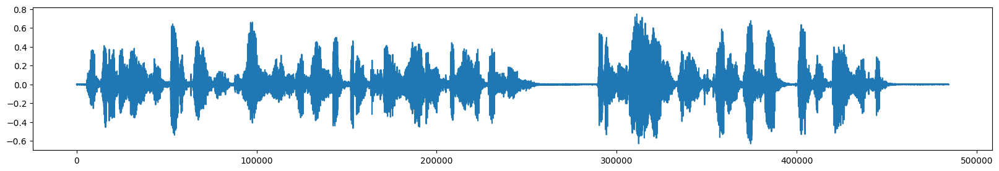

In [ ]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)

#### **Non-stationary noise reduction**

In [ ]:
n_stationary_reduced_noise = nr.reduce_noise(y = data, sr=rate, thresh_n_mult_nonstationary=0.001, stationary=False)

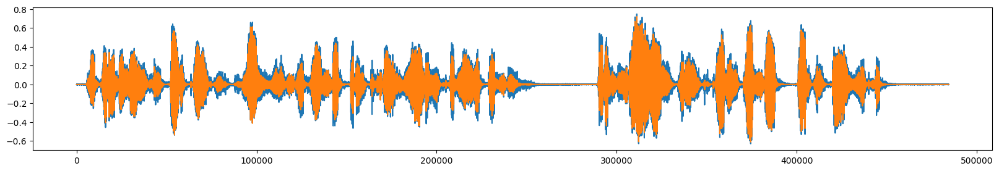

In [ ]:
fig, ax = plt.subplots(figsize=(20,3))
ax.plot(data)
ax.plot(n_stationary_reduced_noise)

In [ ]:
IPython.display.Audio(data=n_stationary_reduced_noise, rate=rate)

In [ ]:
output_path = "/content/chris1.wav"
sf.write(output_path, n_stationary_reduced_noise, rate)

## Testear



> 1° Método: Deteccion ruido con energía y umbral



In [ ]:
from pydub import AudioSegment
import numpy as np

def detectar_ruido(audio_path, umbral=0.5):

    audio = AudioSegment.from_file(audio_path)
    audio_array = np.array(audio.get_array_of_samples())

    # Calcular la energía en cada ventana de tiempo
    ventana_tiempo = int(audio.frame_rate)  # 1 segundo x ventana
    energia = np.sum(np.square(audio_array.reshape(-1, ventana_tiempo)), axis=1)

    # Normalizar la energía
    energia_normalizada = energia / np.max(energia)

    # Identificar segmentos de ruido
    segmentos_ruido = np.where(energia_normalizada > umbral)[0]

    return segmentos_ruido


archivo_audio = "5.wav"
segmentos_ruido_detectados = detectar_ruido(archivo_audio)

print("ruido detectado:", segmentos_ruido_detectados)


FileNotFoundError: ignored

> 2° Método: IA

In [ ]:
from pydub import AudioSegment
from pydub.playback import play

def normalizar_volumen(audio_path, target_dBFS=0.0):

    audio = AudioSegment.from_file(audio_path)


    normalized_audio = audio.normalize(target_dBFS)


    audio_path_normalizado = "polo_normalizado.wav"
    normalized_audio.export(audio_path_normalizado, format="wav")

    return audio_path_normalizado

archivo_audio = "polo.wav"
archivo_audio_normalizado = normalizar_volumen(archivo_audio)

print("Audio normalizado guardado en:", archivo_audio_normalizado)

FileNotFoundError: ignored

## Advanced Inference


In [ ]:

import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"


from IPython.display import Audio
import nltk  # we'll use this to split into sentences
nltk.download('punkt')
import numpy as np

from bark.generation import (
    generate_text_semantic,
    preload_models,
)
from bark.api import semantic_to_waveform
from bark import generate_audio, SAMPLE_RATE

preload_models()

script = """
Ey, ¿Has oído hablar de este nuevo modelo de conversión de texto a audio llamado Bark?
Aparentemente, es el modelo de conversión de texto a audio más realista y con un sonido más natural.""".replace("\n", " ").strip()


sentences = nltk.sent_tokenize(script)

audio_filepath = "/content/chris2.wav"

if os.path.isfile(audio_filepath):
  wav, sr = torchaudio.load(audio_filepath)
  wav = convert_audio(wav, sr, model.sample_rate, model.channels)
  wav = wav.to(device)

  semantic_vectors = hubert_model.forward(wav, input_sample_hz=model.sample_rate)
  semantic_tokens = tokenizer.get_token(semantic_vectors)

  # Extract discrete codes from EnCodec
  with torch.no_grad():
      encoded_frames = model.encode(wav.unsqueeze(0))
  codes = torch.cat([encoded[0] for encoded in encoded_frames], dim=-1).squeeze()

  # move codes to cpu
  codes = codes.cpu().numpy()
  # move semantic tokens to cpu
  semantic_tokens = semantic_tokens.cpu().numpy()

  voice_filename = 'processed.npz'

  current_path = os.getcwd()
  voice_name = os.path.join(current_path, voice_filename)

  np.savez(voice_name, fine_prompt=codes, coarse_prompt=codes[:2, :], semantic_prompt=semantic_tokens)


  GEN_TEMP = 0.6
  current_path = os.getcwd()
  SPEAKER = os.path.join(current_path, 'processed.npz')

  silence = np.zeros(int(0.10 * SAMPLE_RATE))  # quarter second of silence

  pieces = []
  for sentence in sentences:
      semantic_tokens = generate_text_semantic(
          sentence,
          history_prompt=SPEAKER,
          temp=GEN_TEMP,
          min_eos_p=0.05,  # this controls how likely the generation is to end
      )

      audio_array = semantic_to_waveform(semantic_tokens, history_prompt=SPEAKER,)
      pieces += [audio_array, silence.copy()]

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
100%|██████████| 32/32 [00:20<00:00,  1.56it/s]


In [ ]:
Audio(np.concatenate(pieces), rate=SAMPLE_RATE, autoplay=True)

In [ ]:
IPython.display.Audio('chris1.wav')

## Inference

In [ ]:
def inference(text_prompt, audio_filepath, output_path, model, device, text_temp=0.7, waveform_temp=0.7):
  if not os.path.isfile(audio_filepath):
    raise ValueError(f"Audio file not exists ({audio_filepath})")
  wav, sr = torchaudio.load(audio_filepath)
  wav = convert_audio(wav, sr, model.sample_rate, model.channels)
  wav = wav.to(device)

  semantic_vectors = hubert_model.forward(wav, input_sample_hz=model.sample_rate)
  semantic_tokens = tokenizer.get_token(semantic_vectors)

  # Extract discrete codes from EnCodec
  with torch.no_grad():
      encoded_frames = model.encode(wav.unsqueeze(0))
  codes = torch.cat([encoded[0] for encoded in encoded_frames], dim=-1).squeeze()

  # move codes to cpu
  codes = codes.cpu().numpy()
  # move semantic tokens to cpu
  semantic_tokens = semantic_tokens.cpu().numpy()

  voice_filename = 'processed.npz'

  current_path = os.getcwd()
  voice_name = os.path.join(current_path, voice_filename)

  np.savez(voice_name, fine_prompt=codes, coarse_prompt=codes[:2, :], semantic_prompt=semantic_tokens)

  # simple generation
  audio_array = generate_audio(text_prompt, history_prompt=voice_name, text_temp=0.7, waveform_temp=0.7)

  # save audio
  write_wav(output_path, SAMPLE_RATE, audio_array)
  return audio_array

input = '/content/chris1.wav'
output = '/content/clon.wav'
prompt = 'Inicialmente, íbamos a organizar un par de cosas para contarles sobre algunas novedades.'
inference(prompt, input, output, model, device)

100%|██████████| 19/19 [00:11<00:00,  1.59it/s]


array([ 4.6687765e-04, -6.7674468e-05,  1.3306751e-04, ...,
        1.8573424e-05,  2.2604101e-05,  2.7154398e-05], dtype=float32)

In [ ]:
IPython.display.Audio(filename="clon.wav", autoplay=True)

In [ ]:
IPython.display.Audio(filename="macri2.wav")

## Vizz

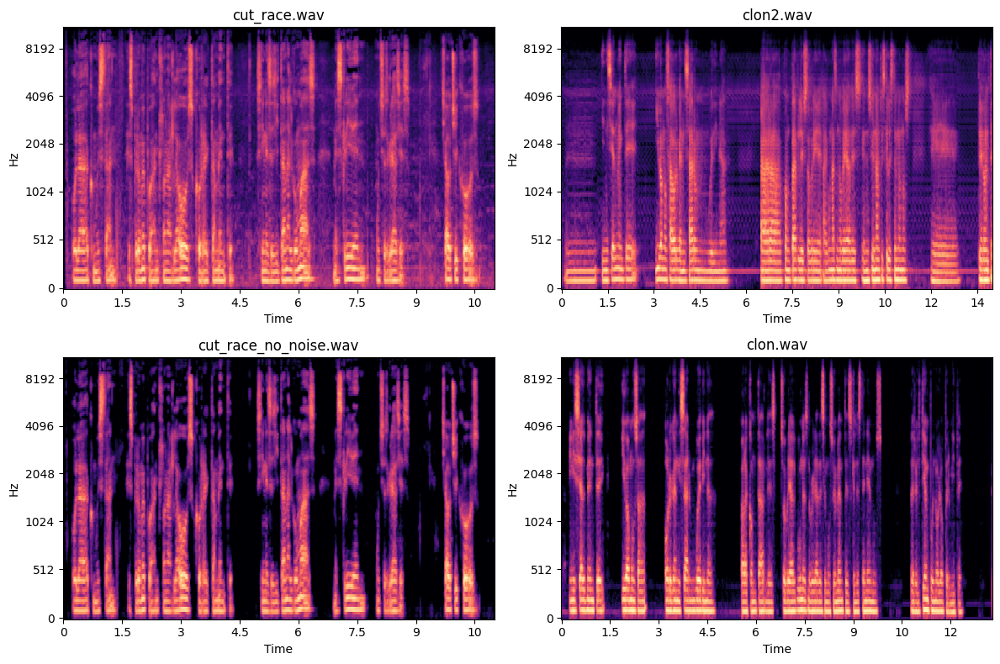

In [ ]:
# Lista de nombres de archivos
archivos = ["cut_race.wav", "clon2.wav", "cut_race_no_noise.wav", "clon.wav"]

def plot_espectrograma(audio_path, ax, title):
    y, sr = librosa.load(audio_path)
    espectrograma = librosa.feature.melspectrogram(y=y, sr=sr)
    librosa.display.specshow(librosa.power_to_db(espectrograma, ref=np.max), y_axis='mel', x_axis='time', ax=ax)
    ax.set_title(title)

# Configurar el diseño de los subgráficos
filas = 2
columnas = 2
fig, axs = plt.subplots(filas, columnas, figsize=(12, 8))

# Iterar sobre la lista de archivos y generar subgráficos
for i, archivo in enumerate(archivos):
    audio_path = "/content/" + archivo  # Ajusta la ruta según tu estructura de carpetas
    fila = i // columnas
    columna = i % columnas
    plot_espectrograma(audio_path, axs[fila, columna], os.path.basename(audio_path))

# Ajustar el diseño y mostrar el gráfico
plt.tight_layout()
plt.show()


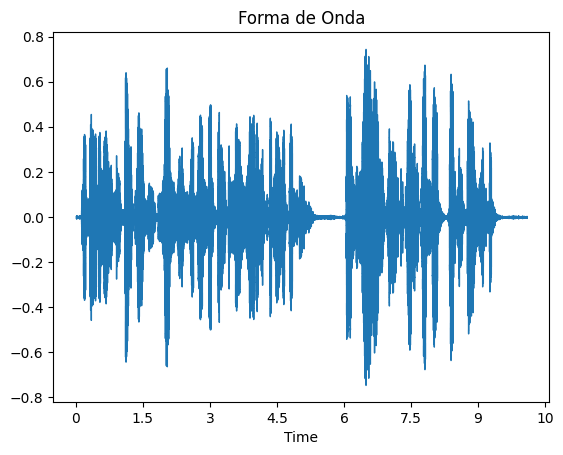

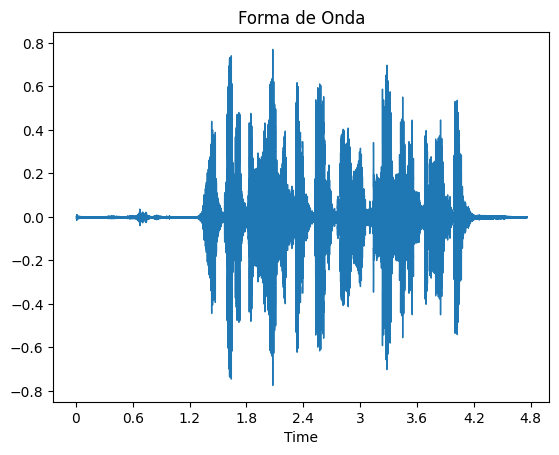

In [ ]:
def plot_forma_onda(audio_path):
    y, sr = librosa.load(audio_path)
    librosa.display.waveshow(y, sr=sr)
    plt.title('Forma de Onda')
    plt.show()

plot_forma_onda('/content/chris2.wav')
plot_forma_onda('/content/clon.wav')